# Homework 1: Panorama stitching

##### Oguzhan Aksoy

### Importing necessary modules

In [61]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import imutils
import os
import glob

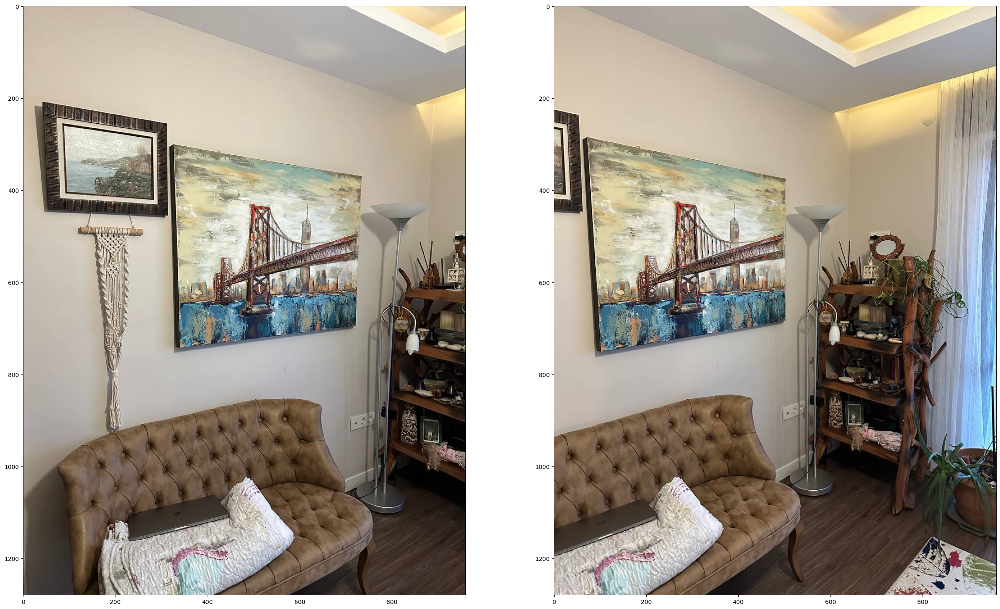

In [62]:
def convertResult(img):
    '''
    in order to display the correct output with matplotlib,
    we need to reduce the range of our floating point image from [0,255] to [0,1]
    and convert the image from BGR to RGB:'''
    img = np.array(img,dtype=float)/float(255)
    img = img[:,:,::-1]
    return img

def plot_images(*imgs, figsize=(30,20), hide_ticks=False):
    '''Display one or multiple images.'''
    f = plt.figure(figsize=figsize)
    width = int(np.ceil(np.sqrt(len(imgs))))
    height = int(np.ceil(len(imgs) / width))
    for i, img in enumerate(imgs, 1):
        ax = f.add_subplot(height, width, i)
        if hide_ticks:
            ax.axis('off')
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# We load our images in the directory to list_images list
list_images = []
for j in sorted(glob.glob('img*.jpg')):
  image = cv2.imread(j)
  list_images.append(image)

plot_images(*list_images[:2])

In [72]:
def get_kp_and_des(image):

  sift = cv2.SIFT_create()

  # Find key points and compute descriptors
  keypoints, descriptors = sift.detectAndCompute(image, None)

  descriptors = np.float32(descriptors)
  return keypoints, descriptors

def drawKeypoints(img, kp):
  img1 = img
  cv2.drawKeypoints(img, kp, img1, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return img1

k0, d0 = get_kp_and_des(list_images[0])
k1, d1 = get_kp_and_des(list_images[1])

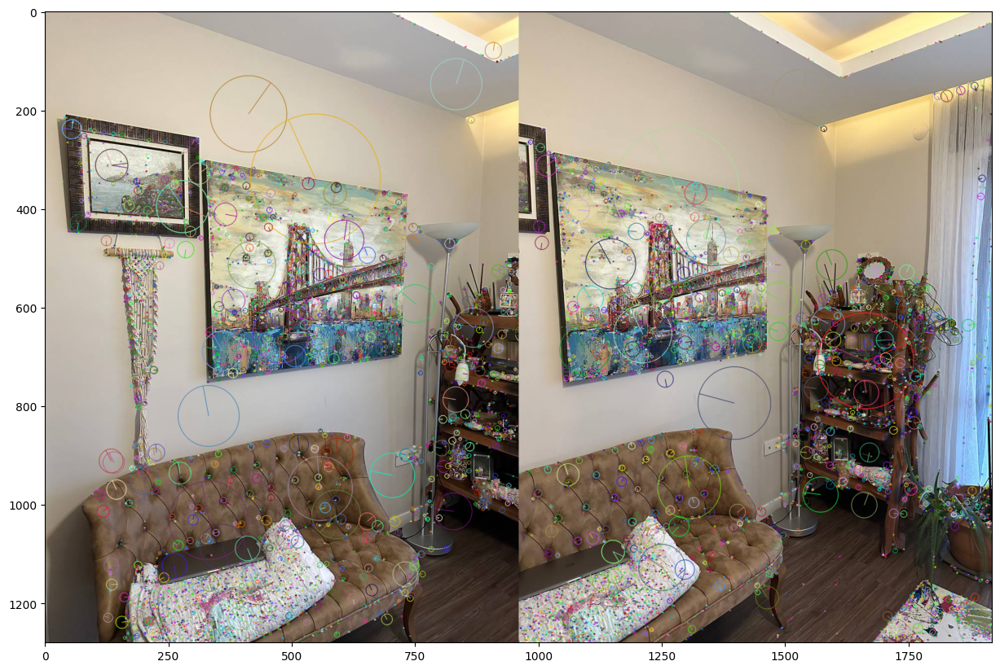

In [64]:
img0_kp = drawKeypoints(list_images[0].copy(), k0)
img1_kp = drawKeypoints(list_images[1].copy(), k1)

plt_img = np.concatenate((img0_kp, img1_kp), axis=1)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(plt_img))

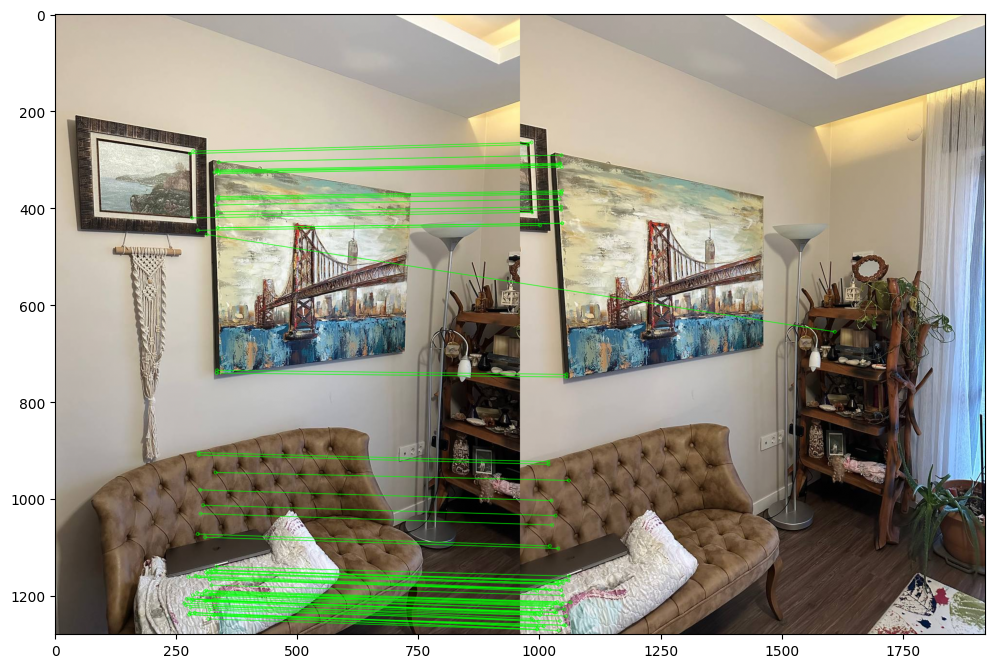

In [88]:
def match_descriptors(descriptors_A, descriptors_B, ratio=0.75):
  """
    matching descriptors beetween 2 descriptors.
    BruteForce algorithm is used.
  """

  descriptor_matcher = cv2.DescriptorMatcher_create("BruteForce")
  # k-NN matching between the two feature vector sets using k=2
  # (indicating the top two matches for each feature vector are returned).
  matches = descriptor_matcher.knnMatch(descriptors_A, descriptors_B, k=2)

  # store all the good matches as per Lowe's ratio test
  good = []
  for m, n in matches:
    if m.distance < ratio * n.distance:
      good.append(m)
  if len(good) > 4:
    return good

def generateHomography(src_img, dst_img, ransacRep=5.0):
  """
      @Return Homography matrix,
      @param src_img is the image which is warped by homography,
      @param dst_img is the image which is choosing as pivot,
      @param ransacRep is the maximum pixel “wiggle room” allowed by the RANSAC algorithm
      """

  src_kp, src_features = get_kp_and_des(src_img)
  dst_kp, dst_features = get_kp_and_des(dst_img)

  good = match_descriptors(src_features, dst_features)

  src_points = np.float32([src_kp[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
  dst_points = np.float32([dst_kp[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

  H, mask = cv2.findHomography(src_points, dst_points, cv2.RANSAC, ransacRep)
  matchesMask = mask.ravel().tolist()
  return H, matchesMask

def drawMatches(src_img, src_kp, dst_img, dst_kp, matches, matchesMask):
  draw_params = dict(
      matchColor=(0, 255, 0),  # draw matches in green color
      singlePointColor=None,
      matchesMask=matchesMask[:100],  # draw only inliers
      flags=2,
  )
  return cv2.drawMatches(src_img, src_kp, dst_img, dst_kp, matches[:100], None, **draw_params)

#matching features using BruteForce
mat = match_descriptors(d0, d1,ratio=0.6)

#Computing Homography matrix and mask
H,matMask = generateHomography(list_images[0],list_images[1])

#draw matches
img = drawMatches(list_images[0],k0,list_images[1],k1,mat,matMask)
plt.figure(figsize=(12,12))
plt.imshow(convertResult(img))

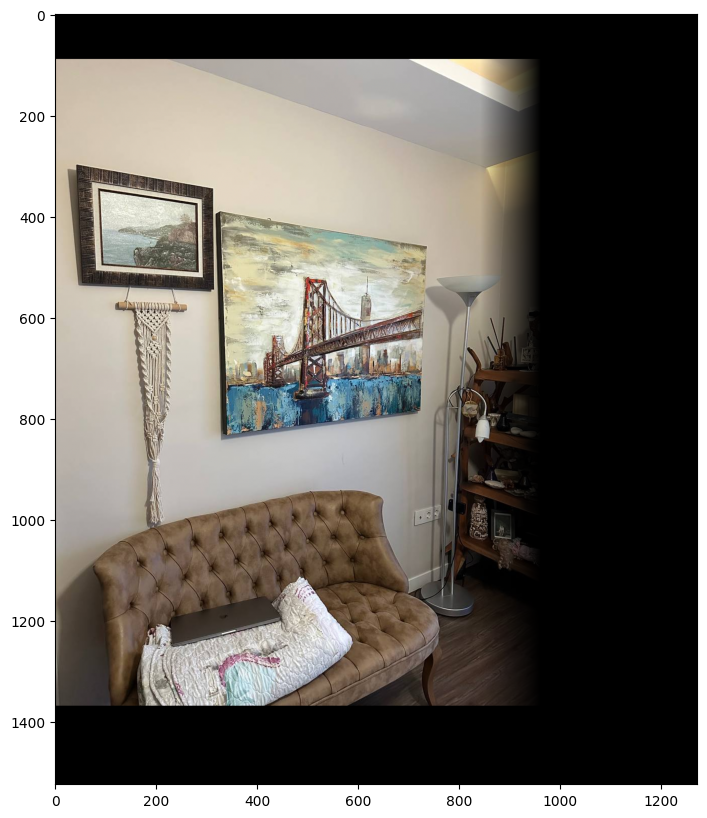

In [83]:
def crop(panorama, h_dst, corners):
    """
      Crop panorama based on destination.
      @param panorama is the panorama
      @param h_dst is the height of destination image
      @param corner is the tuple which containing 4 corners of warped image and 4 corners of destination image
    """

    # find max min of x,y coordinate
    [xmin, ymin] = np.int32(corners.min(axis=0).ravel() - 0.5)
    t = [-xmin, -ymin]
    corners = corners.astype(int)

    # corners[0][0][0] is the X coordinate of top-left point of warped image
    # If it has a negative value, warp image is merged to the left side of destination image
    # otherwise is merged to the right side of destination image
    if corners[0][0][0] < 0:
      n = abs(-corners[1][0][0] + corners[0][0][0])
      panorama = panorama[t[1] : h_dst + t[1], n:, :]
    else:
      if corners[2][0][0] < corners[3][0][0]:
        panorama = panorama[t[1] : h_dst + t[1], 0 : corners[2][0][0], :]
      else:
        panorama = panorama[t[1] : h_dst + t[1], 0 : corners[3][0][0], :]
    return panorama

def blendingMask(height, width, barrier, smoothing_window, left_biased=True):
  assert barrier < width
  mask = np.zeros((height, width))

  offset = int(smoothing_window / 2)
  try:
    if left_biased:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(1, 0, 2 * offset + 1).T, (height, 1))
      mask[:, : barrier - offset] = 1
    else:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(0, 1, 2 * offset + 1).T, (height, 1))
      mask[:, barrier + offset :] = 1
  except BaseException:
    if left_biased:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(1, 0, 2 * offset).T, (height, 1))
      mask[:, : barrier - offset] = 1
    else:
      mask[:, barrier - offset : barrier + offset + 1] = np.tile(np.linspace(0, 1, 2 * offset).T, (height, 1))
      mask[:, barrier + offset :] = 1

  return cv2.merge([mask, mask, mask])


def panoramaBlending(dst_img_rz, src_img_warped, width_dst, side, showstep=False):
  """
    Blend two images to create a seamless panorama.
  """
  h, w, _ = dst_img_rz.shape
  smoothing_window = int(width_dst / 8)
  barrier = width_dst - int(smoothing_window / 2)
  mask1 = blendingMask(h, w, barrier, smoothing_window=smoothing_window, left_biased=True)
  mask2 = blendingMask(h, w, barrier, smoothing_window=smoothing_window, left_biased=False)

  if showstep:
    nonblend = src_img_warped + dst_img_rz
  else:
    nonblend = None
    leftside = None
    rightside = None

  if side == "left":
    dst_img_rz = cv2.flip(dst_img_rz, 1)
    src_img_warped = cv2.flip(src_img_warped, 1)
    dst_img_rz = dst_img_rz * mask1
    src_img_warped = src_img_warped * mask2
    pano = src_img_warped + dst_img_rz
    pano = cv2.flip(pano, 1)
    if showstep:
      leftside = cv2.flip(src_img_warped, 1)
      rightside = cv2.flip(dst_img_rz, 1)
  else:
    dst_img_rz = dst_img_rz * mask1
    src_img_warped = src_img_warped * mask2
    pano = src_img_warped + dst_img_rz
    if showstep:
      leftside = dst_img_rz
      rightside = src_img_warped

  return pano, nonblend, leftside, rightside

def warpTwoImages(src_img, dst_img, showstep=False):
  """
    Warps a source image onto a destination image using a homography matrix and blends them to create a seamless panorama.
  """
  # generate Homography matrix
  H, _ = generateHomography(src_img, dst_img)

  # get height and width of two images
  height_src, width_src = src_img.shape[:2]
  height_dst, width_dst = dst_img.shape[:2]

  # extract corners of two images: top-left, bottom-left, bottom-right, top-right
  pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
  pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)

  try:
    # apply homography to corners of src_img
    pts1_ = cv2.perspectiveTransform(pts1, H)
    pts = np.concatenate((pts1_, pts2), axis=0)

    # find max min of x,y coordinate
    [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
    [_, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]

    # top left point of image which apply homography matrix, which has x coordinate < 0, has side=left
    # otherwise side=right
    # source image is merged to the left side or right side of destination image
    if pts[0][0][0] < 0:
        side = "left"
        width_pano = width_dst + t[0]
    else:
        width_pano = int(pts1_[3][0][0])
        side = "right"
    height_pano = ymax - ymin

    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
    src_img_warped = cv2.warpPerspective(
        src_img, Ht.dot(H), (width_pano, height_pano)
    )

    # generating size of dst_img_rz which has the same size as src_img_warped
    dst_img_rz = np.zeros((height_pano, width_pano, 3))
    if side == "left":
      dst_img_rz[t[1] : height_src + t[1], t[0] : width_dst + t[0]] = dst_img
    else:
      dst_img_rz[t[1] : height_src + t[1], :width_dst] = dst_img

    # blending panorama
    pano, nonblend, leftside, rightside = panoramaBlending(dst_img_rz, src_img_warped, width_dst, side, showstep=showstep)

    # croping black region
    pano = crop(pano, height_dst, pts)
    return pano, nonblend, leftside, rightside
  except BaseException:
    raise Exception("Please try again with another image set!")

pano,non_blend,left_side,right_side = warpTwoImages(list_images[1],list_images[0],True)

# display the leftside of pano before cropping
plt.figure(figsize=(12,12))
plt.imshow(convertResult(left_side))

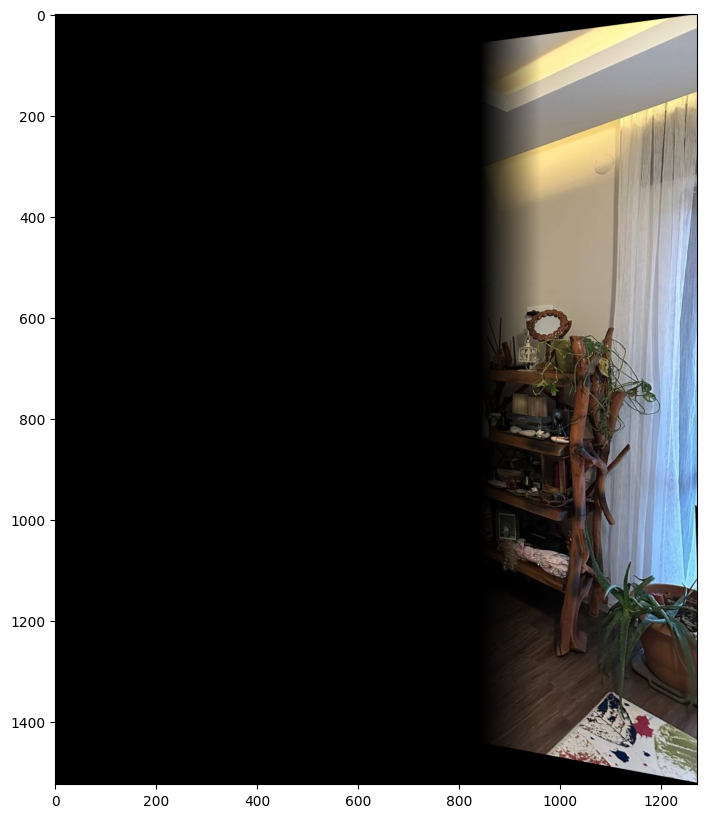

In [84]:
# display the rightside of pano before cropping
plt.figure(figsize=(12,12))
plt.imshow(convertResult(right_side))

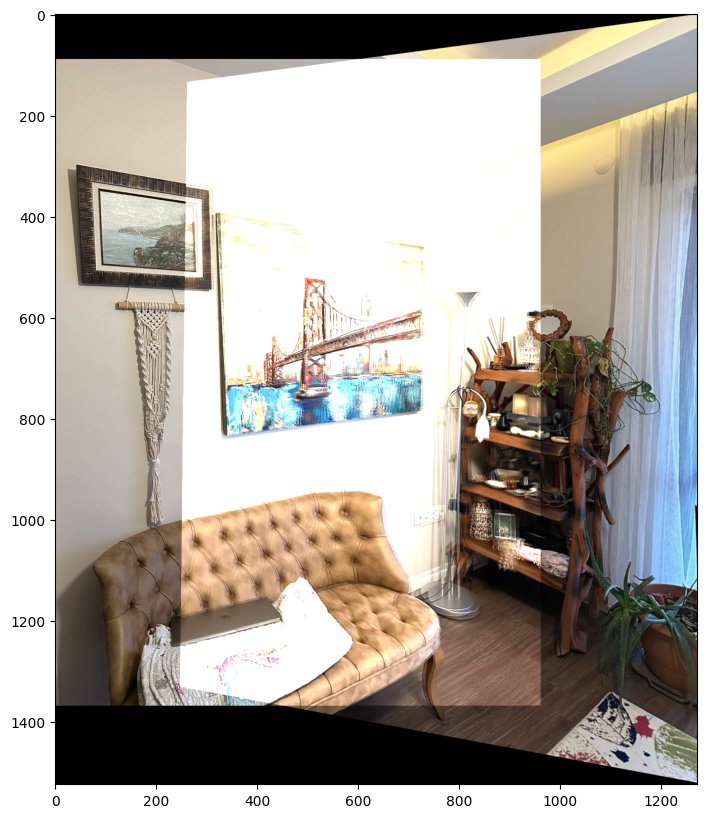

In [85]:
# display pano without cropping and blending
plt.figure(figsize=(12,12))
plt.imshow(convertResult(non_blend))

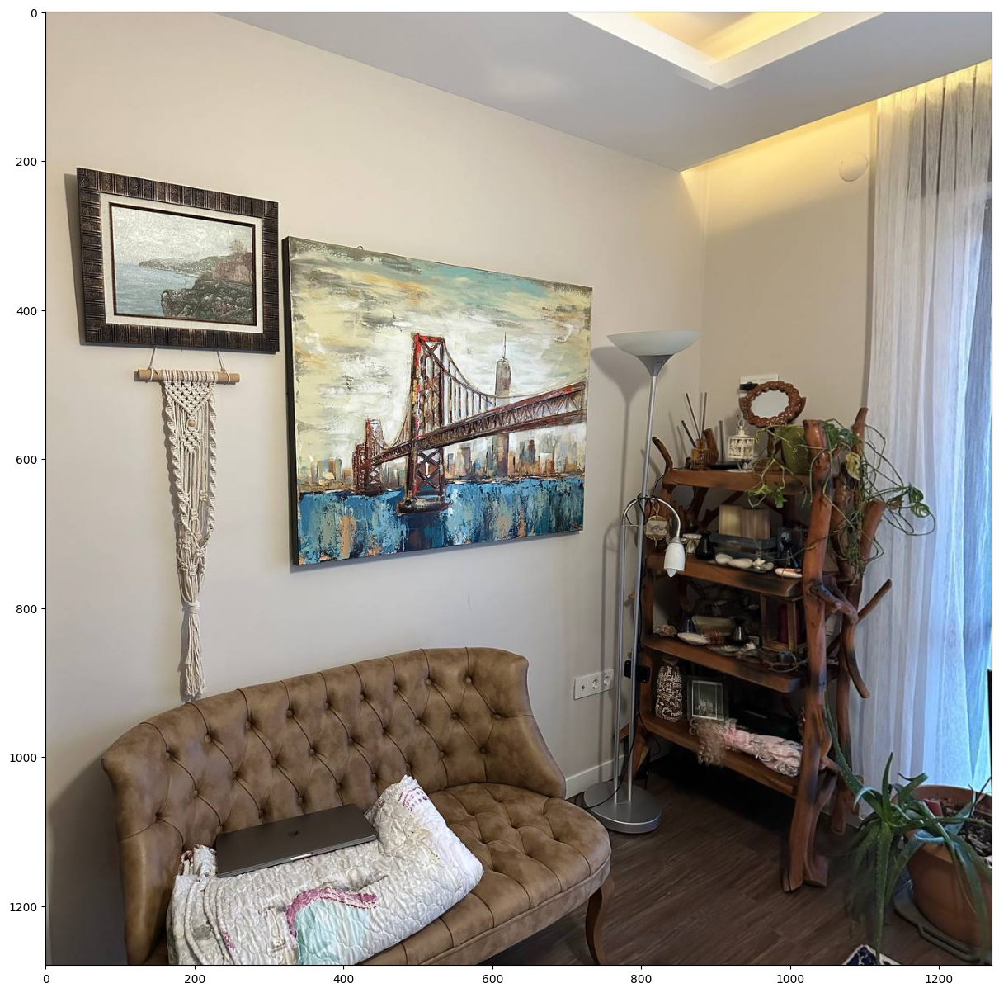

In [69]:
# pano after cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(pano))

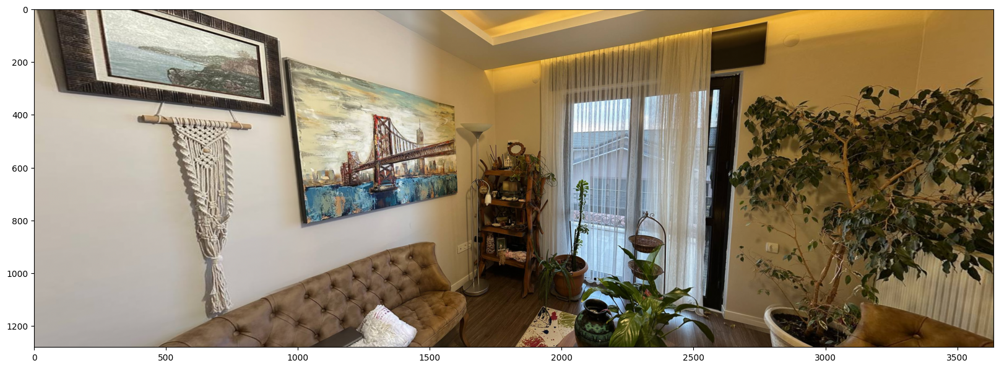

In [70]:
def multiStitching(list_images):
  """
  Stitches together a list of images to create a panorama using a multi-stitching approach.

    Parameters:
    - list_images (list): List of images to be stitched. The order is crucial for correct stitching.

    Returns:
    - fullpano: Stitched panorama image.
  """

  n = int(len(list_images) / 2 + 0.5)
  left = list_images[:n]
  right = list_images[n - 1 :]
  right.reverse()
  while len(left) > 1:
    dst_img = left.pop()
    src_img = left.pop()
    left_pano, _, _, _ = warpTwoImages(src_img, dst_img)
    left_pano = left_pano.astype("uint8")
    left.append(left_pano)

  while len(right) > 1:
    dst_img = right.pop()
    src_img = right.pop()
    right_pano, _, _, _ = warpTwoImages(src_img, dst_img)
    right_pano = right_pano.astype("uint8")
    right.append(right_pano)

  # if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
  if right_pano.shape[1] >= left_pano.shape[1]:
    fullpano, _, _, _ = warpTwoImages(left_pano, right_pano)
  else:
    fullpano, _, _, _ = warpTwoImages(right_pano, left_pano)
  return fullpano

panorama = multiStitching(list_images)
plt.figure(figsize=(20,20))
plt.imshow(convertResult(panorama))